# ECE590: Smart Cameras Homework 2
## Nathan Inkawhich
**Duke University Spring 2019**

The goal of this homework is to write an **auto-focus** and **auto-exposure** algorithm for the provided IP cameras.

**Imports**

In [1]:
import time
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import subprocess
import skimage
import skimage.io as imio
import skimage.transform as trans
from skimage.viewer import ImageViewer
#import glob
import re
from time import gmtime, strftime, sleep
%matplotlib inline
mpl.rcParams['figure.figsize'] = (10.0, 6.0) 


/Users/nathaninkawhich/anaconda/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/viewer/utils/core.py:10: UserWarning: Recommended matplotlib backend is `Agg` for full skimage.viewer functionality.
  warn("Recommended matplotlib backend is `Agg` for full "


**Test command to make sure we can run remote commands**

In [2]:
subprocess.run("ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 'ls'", stdout=subprocess.PIPE, shell=True)

CompletedProcess(args="ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 'ls'", returncode=0, stdout=b'aqueti\nAquetiACI-aarch64_2.0.5.3_beta.deb\nAquetiDaemon-aarch64_2.0.5.3_beta.deb\nbin\ncuda-l4t\ncudnn\ndbGrab_10081_s01_00000.jpg\ndbGrab_10308_s01_00000.jpg\ndbGrab_10399_s01_00000.jpg\ndbGrab_10491_s00_00000.jpg\ndbGrab_10579_s00_00000.jpg\ndbGrab_3731_s01_00000.jpg\ndbGrab_4895_s00_00000.jpg\ndbGrab_5008_s00_00000.jpg\ndbGrab_5123_s00_00000.jpg\ndbGrab_5253_s00_00000.jpg\ndbGrab_5373_s00_00000.jpg\ndbGrab_5527_s01_00000.jpg\ndbGrab_5643_s01_00000.jpg\ndbGrab_5754_s01_00000.jpg\ndbGrab_5874_s01_00000.jpg\ndbGrab_6203_s00_00000.jpg\ndbGrab_6321_s00_00000.jpg\ndbGrab_6432_s00_00000.jpg\ndbGrab_6545_s00_00000.jpg\ndbGrab_6657_s00_00000.jpg\ndbGrab_6769_s00_00000.jpg\ndbGrab_6910_s00_00000.jpg\ndbGrab_7854_s00_00000.jpg\ndbGrab_8664_s00_00000.jpg\ndbGrab_8785_s00_00000.jpg\ndbGrab_8897_s00_00000.jpg\ndbGrab_9010_s00_00000.jpg\ndbGrab_9122_s00_00000.jpg\ndbGrab_9237_s00_00000.jpg\ndbGrab_

### Camera helper functions

Here we define three important helper functions for working with the cameras. The ```grabImage``` function takes an image on the remote camera, saves it as a jpg, secure copies it to our local machine, then reads the image into this notebook. The ```resetFocus``` function resets the focus motor of the camera to the "zero" position. The ```moveFocus``` function moves the focus motor of the camera by a desired step. Note the steps are relative to wherever the position is currently but should be in the range of [-500,500] from the zeroth position.

In [3]:
# Take an image on the sensor and scp it to local machine
def grabImage(sid=0, imres=3):
    # I will use the file name inkGrab.... for the image grabbed from the camera. First step is to get rid of previously grabbed images
    subprocess.run('rm inkGrab*', stdout=subprocess.PIPE, shell=True)
    subprocess.run('ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "rm inkGrab*"', stdout=subprocess.PIPE, shell=True)
    # ok, now let's grab an image on the tegra
    cmD='ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "nvgstcapture-1.0 -m 1 --sensor-id '+str(sid)+' -A --capture-auto 1 --file-name inkGrab --image-res '+ str(imres)+'"'
    subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    subprocess.run('scp -i ~/.ssh/smartcamkey nvidia@10.236.176.38:inkGrab* .', stdout=subprocess.PIPE, shell=True)
    #ok, now let's find the file name of the image we just grabbed and transfered 
    pop=subprocess.run('ls',stdout=subprocess.PIPE, shell=True)
    rePop=pop.stdout
    rePop=rePop.decode("utf-8")
    fileName = re.search(r'inkGrab(.*).jpg', rePop)
    fileName=fileName.group()
    pop=imio.imread(fileName)
    #pop=skimage.transform.rotate(pop,180)
    return pop

# Reset the focus point of the camera to the "zero" position
def resetFocus(sid=1):
    cmD='ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "python2 ~/bin/resetFocusMotor.py '+str(sid)+'"'
    pop=subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    print(cmD)
    return pop.stdout

# Move the relative focus point of the camera (position is stepped relative to current position)
def moveFocus(sid=1, step=100):
    cmD='ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "python2 ~/bin/moveFocusMotor.py '+str(sid)+' '+str(step)+'"'
    pop=subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    print(cmD)
    return pop.stdout



**Test camera helper functions**

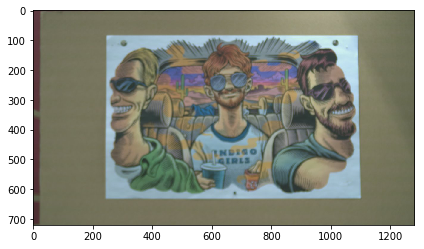

In [4]:
pip=grabImage(sid=0, imres=3)
imio.imshow(pip)

In [5]:
resetFocus(sid=1) # Set focus to "zero" position

ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "python2 ~/bin/resetFocusMotor.py 1"


b"address is 0\nbusnumber is <smbus.SMBus object at 0x7fb03400b0>\nim initializing here\n['1']\nnow my address is 96\nnow my bus is 30\naddress is 96\nbusnumber is <smbus.SMBus object at 0x7fb0340170>\nim initializing here\ntrying to reset here\ntrying to build command here\n01010a0400\ndata part of command is [1, 1, 10, 4, 0]\nWidth        = 16\nPoly         = 0x1021\nReflectIn    = False\nXorIn        = 0x0000\nReflectOut   = False\nXorOut       = 0x0000\nAlgorithm    = UNDEFINED\n\ncrc is 216\nI think the full cmd should be [126, 215, 224, 1, 1, 10, 4, 0, 126]\nI2C: Writing list to register 0x60:\n[126, 215, 224, 1, 1, 10, 4, 0, 126]\n"

In [6]:
moveFocus(sid=1, step=-200) # Set to -200

ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "python2 ~/bin/moveFocusMotor.py 1 -200"


b"address is 0\nbusnumber is <smbus.SMBus object at 0x7f8be5c0b0>\nim initializing here\n['1', '-200']\nnow my address is 96\nnow my bus is 30\naddress is 96\nbusnumber is <smbus.SMBus object at 0x7f8be5c170>\nim initializing here\nReceiving motor position\nI2C: Writing list to register 0x60:\n[126, 239, 120, 16, 1, 1, 6, 0, 126]\nError accessing 0x60: Check your I2C address\nError accessing 0x60: Check your I2C address\ncheckedout output is \n-1\n"

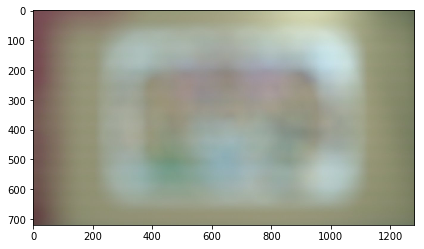

In [7]:
pip=grabImage(sid=0, imres=3)
imio.imshow(pip)

## Auto-focus Algorithm

**How to define focus?**

In the given code, there was the ```focusMetric_simpleLaplace``` which defines quality of focus by the total sum of energy in a laplace filtered version of the green channel of the captured image. This is a "quick and dirty" method to get an idea of focus but we may do better. The focus metric used here is the ```focusMetric_Laplace_v1``` which also laplace filters the green channel of the image, however rather than returning the sum of all energy it returns the sum of values that occupy the top 10% of all values. Intuitively, in a sharp image that is well focused there would be a lot of energy in this top 10%. In a poorly focused image, the energy may be more spread out and there would be little energy in the top percentage.

In [8]:
def focusMetric_simpleLaplace(ss=0):
    pip=grabImage(sid=ss, imres=8)
    pop=np.sum(np.abs(skimage.filters.laplace(pip[:,:,1])))
    return pop

def focusMetric_Laplace_v1(ss=0):
    pip=grabImage(sid=ss, imres=8)
    pop=np.abs(skimage.filters.laplace(pip[:,:,1]))
    thresh = np.percentile(pop, 90)
    pop[pop<thresh] = 0
    focus = np.sum(pop)
    return focus


Print a sample of a laplace filtered green channel. This is the information used in both focus metrics.

63708.662745098045
19736.61960784316


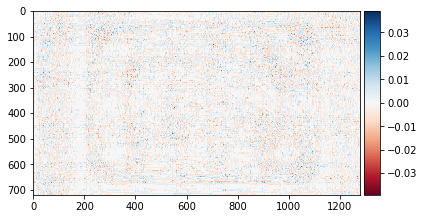

In [9]:
print(focusMetric_simpleLaplace(ss=0))
print(focusMetric_Laplace_v1(ss=0))
imio.imshow(skimage.filters.laplace(pip[:,:,1]))

### Focus Algorithm

The focus algorithm here is as follows. Knowing that the reasonable range of step values is [-500,500] we first move the focus motor to absolute step -500. We then take an image and calculate it's focus with ```focusMetric_Laplace_v1```. Then, we advance the step motor +100 to absolute step -400 and repeat. We continue measuring the focus at steps of 100 until we reach absolute step +500. After sweeping the full range, we set the focus of the camera to the position that recorded the **maximum** focus value. 

In [10]:
# Note: something is screwed up with the sid indexes. For the grabImage function
#   the cameras are 0-indexed and for the reset and move functions, the cameras
#   are 1-indexed. 

# Args to pass
RES = 8

# Stat keepers
focus_history = [] # focus values at each step
step_history = [] # absolute step values relative to 0
image_history = [] # for saving samples of images at each focus

# Set initial position
resetFocus(sid=1) # Set focus to "zero" position
moveFocus(sid=1, step=-500) # Set to -500

# Sweep steps across [-500:500:100] and record focus values
for i in range(11):
    time.sleep(3)
    # Grab a sample image from this focus step and save it for later
    image_history.append(grabImage(sid=0, imres=RES))
    # Calculate the focus metric at this position
    focus_history.append(focusMetric_Laplace_v1(ss=0))
    # Record what absolute step we are at
    step_history.append(-500+100*i)
    # Take a step and repeat
    moveFocus(sid=1,step=100)
    print("Step: {}, Focus: {}".format(step_history[-1],focus_history[-1]))
    
# Done sweeping, now get the argument position of the largest focus value
best_focus_pos = np.argmax(focus_history)
# Reset focus to absolute "zero"
resetFocus(sid=1)
# Set the focus to the "best" focus value from the sweep
moveFocus(sid=1, step=step_history[best_focus_pos])

print("Setting Focus To: ",step_history[best_focus_pos])

ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "python2 ~/bin/resetFocusMotor.py 1"
ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "python2 ~/bin/moveFocusMotor.py 1 -500"
ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "python2 ~/bin/moveFocusMotor.py 1 100"
Step: -500, Focus: 19804.77647058826
ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "python2 ~/bin/moveFocusMotor.py 1 100"
Step: -400, Focus: 24376.011764705887
ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "python2 ~/bin/moveFocusMotor.py 1 100"
Step: -300, Focus: 59308.84705882353
ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "python2 ~/bin/moveFocusMotor.py 1 100"
Step: -200, Focus: 20310.254901960776
ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "python2 ~/bin/moveFocusMotor.py 1 100"
Step: -100, Focus: 18657.6392156863
ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "python2 ~/bin/moveFocusMotor.py 1 100"
Step: 0, Focus: 18938.356862745113
ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "python2 ~/bin/moveFocusMotor.py 1 100

After sweeping, we can plot the value of the focus metric at each step. Here, absolute step -300 is clearly the highest value meaning the auto-focus algorithm will set the focus motor to -300.

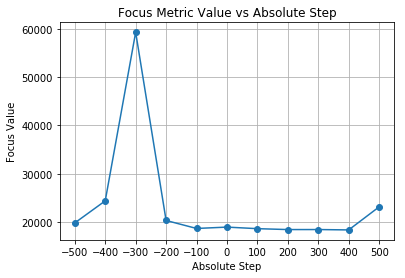

In [11]:
plt.plot(step_history,focus_history,'o-')
plt.title("Focus Metric Value vs Absolute Step")
plt.xlabel("Absolute Step")
plt.ylabel("Focus Value")
plt.xticks(step_history)
plt.grid()
plt.show()

Now we plot the collected images at each step value to verify that the -300 image is the best. Below shows the sequence of captured images in order. Notice, -300 is infact the highest quality image.

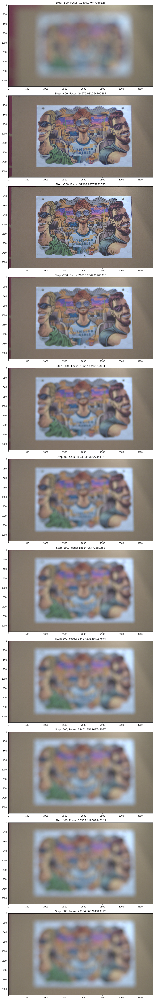

In [12]:
plt.figure(figsize=(10,6*11))
cnt = 1
for i in range(len(step_history)):
    plt.subplot(11,1,cnt)
    plt.imshow(image_history[i])
    plt.title("Step: {}, Focus: {}".format(step_history[i],focus_history[i]))
    cnt += 1
plt.tight_layout()
plt.show()

**Show the "most" focused image**

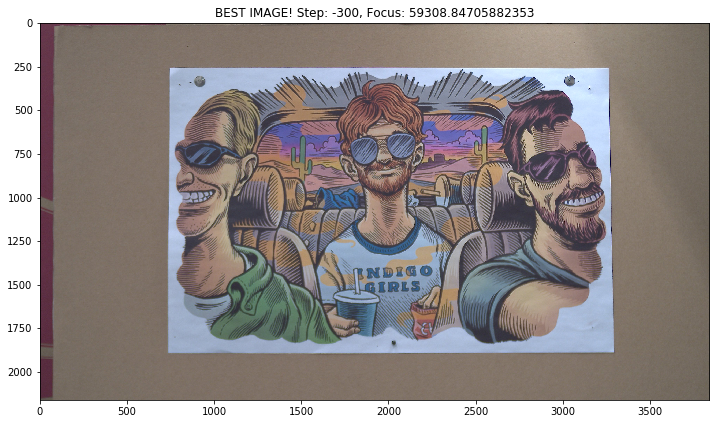

In [13]:
plt.figure(figsize=(12,8))
plt.imshow(image_history[best_focus_pos])
plt.title("BEST IMAGE! Step: {}, Focus: {}".format(step_history[best_focus_pos],focus_history[best_focus_pos]))
plt.show()

## Auto-exposure Algorithm

The first thing we need to do is define a function that will capture an image with a set amount of exposure time. To do this we will mostly leverage the old ```grabImage``` function, but modify it so we can specify an exposure time in seconds.

In [14]:
# Take an image on the sensor and scp it to local machine
def grabImage_withExposure(sid=0, imres=3, expoTime=0.1):
    # I will use the file name inkGrab.... for the image grabbed from the camera. First step is to get rid of previously grabbed images
    subprocess.run('rm inkGrab*', stdout=subprocess.PIPE, shell=True)
    subprocess.run('ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "rm inkGrab*"', stdout=subprocess.PIPE, shell=True)
    # ok, now let's grab an image on the tegra
    cmD='ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "nvgstcapture-1.0 -m 1 --sensor-id '+str(sid)+' -A --capture-auto 1 --file-name inkGrab --exposure-time='+str(expoTime)+ ' --image-res '+ str(imres)+'"'
    subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    subprocess.run('scp -i ~/.ssh/smartcamkey nvidia@10.236.176.38:inkGrab* .', stdout=subprocess.PIPE, shell=True)
    #ok, now let's find the file name of the image we just grabbed and transfered 
    pop=subprocess.run('ls',stdout=subprocess.PIPE, shell=True)
    rePop=pop.stdout
    rePop=rePop.decode("utf-8")
    fileName = re.search(r'inkGrab(.*).jpg', rePop)
    fileName=fileName.group()
    pop=imio.imread(fileName)
    #pop=skimage.transform.rotate(pop,180)
    return pop


**Manually test a long and short exposure time and visualize how that impacts the image**

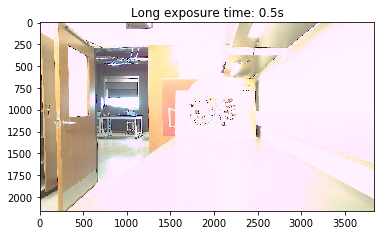

In [18]:
# Grab an image with a long exposure time
pip=grabImage_withExposure(sid=1, imres=8, expoTime=0.5)
plt.imshow(pip)
plt.title("Long exposure time: 0.5s")
plt.show()

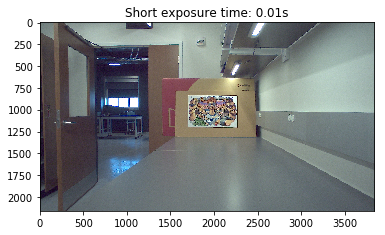

In [19]:
# Grab an image with a short exposure time
pip=grabImage_withExposure(sid=1, imres=8, expoTime=0.01)
plt.imshow(pip)
plt.title("Short exposure time: 0.01s")
plt.show()

### Exposure algorithm

One way we can intuitively check if an image is taken with reasonable exposure is to check how many of the pixel values are at saturation (i.e. white). If many pixel values are near 255, or white, the image is likely over-exposed and the exposure time should be decreased. If too few pixel values are near 255, the image is likely to be too dark so we may increase the exposure time to allow more light to be collected. To measure how saturated an image is, we define the ```saturationMetric``` which calculates what percentage of pixel values in the image are saturated (i.e. $value>240$).

Now we can write an autoexposure algorithm to find a reasonable exposure automatically. First, using prior knowledge of reasonable exposure times, we will start with the relatively high exposure time of 1 second. If the scene is dark, the image may be reasonable in this region but if the scene is light the image will likely be overexposed. If we detect that more than 5% of pixels are saturated, we will decrease the exposure time by a factor of 2 and retest. We will stop when no more than 5% of pixel values in the image are saturated. Note, this algorithm is not designed for very dark image scenarios that would require more than 1 second exposure.

In [25]:
# Calculate the percentage of pixels in saturation at this exposure time
def saturationMetric(ss=1, expo=0.5):
    pip=grabImage_withExposure(sid=ss, imres=8, expoTime=expo)
    saturation_threshold = 240.
    binary_img = np.zeros_like(pip)
    binary_img[pip>saturation_threshold] = 1
    saturation_val = np.count_nonzero(binary_img)/float(binary_img.size)
    # Return the saturation value and the image we used to calculate it
    return saturation_val,pip

In [35]:
saturated = True
cnt = 0
max_cnt = 10
initial_exposure = 1. # Initial exposure time to try
decay = 0.5

# Stat keepers
expo_image_history = []
expo_value_history = []
saturation_value_history = []

# While the image is saturated
while saturated and (cnt<max_cnt):
    
    # Calculate the saturation metric
    sat,img = saturationMetric(ss=1, expo=(initial_exposure*(decay**cnt)))
    expo_image_history.append(img)
    expo_value_history.append(initial_exposure*(decay**cnt))
    saturation_value_history.append(sat)
    print("Exposure Time: {}, Saturation: {}".format(initial_exposure*(decay**cnt),sat))
    
    # Decide if we should continue
    if sat < .05:
        saturated = False
        print("Found good image, exiting...")
    
    cnt += 1

Exposure Time: 1.0, Saturation: 0.396938376093107
Exposure Time: 0.5, Saturation: 0.39691506719393005
Exposure Time: 0.25, Saturation: 0.23902685345936214
Exposure Time: 0.125, Saturation: 0.0687137104552469
Exposure Time: 0.0625, Saturation: 0.0057272778420781895
Found good image, exiting...


After running the auto-exposure algorithm we see that after 4 decay steps of exposure time, the algorithm found 1/16th of a second to be a good exposure time. To verify this qualitatively, we now plot a sample image captured at each of the tested exposure times.

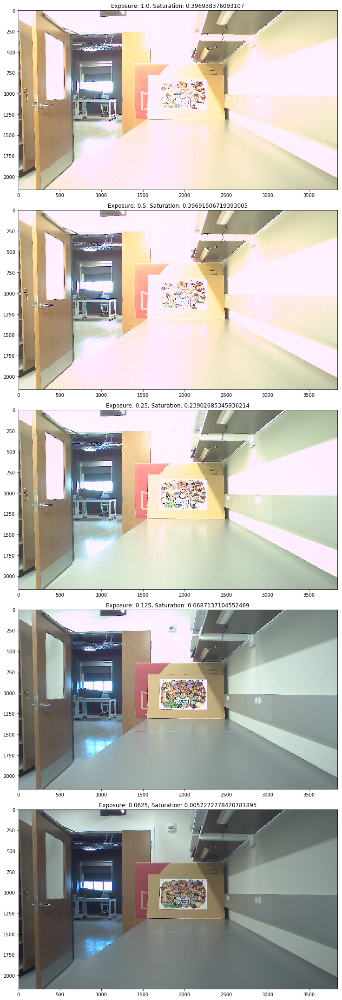

In [36]:
plt.figure(figsize=(10*len(expo_image_history),6*len(expo_image_history)))
cnt = 1
for i in range(len(expo_image_history)):
    plt.subplot(len(expo_image_history),1,cnt)
    plt.imshow(expo_image_history[i])
    plt.title("Exposure: {}, Saturation: {}".format(expo_value_history[i],saturation_value_history[i]))
    cnt += 1
plt.tight_layout()
plt.show()

Finally, we can view the saturation metric value at each of the tested exposure times. Note, the values were collected in reverse of the shown x-axis, meaning the first point measured was $2^0=1 second$.

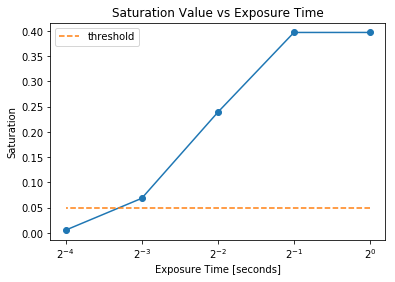

In [42]:
plt.plot(expo_value_history,saturation_value_history,'o-')
plt.plot(expo_value_history,[.05]*len(saturation_value_history),'--',label="threshold")
plt.title("Saturation Value vs Exposure Time")
plt.xlabel("Exposure Time [seconds]")
plt.ylabel("Saturation")
plt.xscale('log',basex=2)
plt.legend()
plt.show()